# Počet foci v závislosti na roztoku

Data jsou mereni na urovni jednotlivych bunek ("Cells.csv"), jednotlivych foci ("Foci.csv") a na urovni jamek ("Cells Stats.csv"). Foci jsou zafokusované proteiny, jejichž koncentrace nás zajímá. 
Vyhodnocovat se bude pocet foci na bunku (sloupec "(Foci (Nuclei)) COUNT" v souboru "Cells.csv"), jde o zhodnoceni charakteru techto dat a zpusobu porovnavani dat mezi sebou. Metadata k jamkam jsou v souboru "Cells Stats.csv" - sloupec "Compound" oznacuje typ deplece, non-treated NT, nebo nazev siRNA, sloupec "Dose" je koncentrace dalsiho treatmentu CPT 

https://owncloud.cesnet.cz/index.php/s/UgSV5MbtenDWMf2

# Cíl práce

#### Zavedeme si diskrétní náhodnou veličinu X, která bude označovat počty foci v nějaké buňce.
#### Domnívám se, že pro kažkou jamku (malou "zkumavku", která je součástí velkého pláta s dalšími jamkami) bude mít X poisonnovské rozložení. Tuto hypotézu si ověříme.

## Imports and data loading

In [1]:
import pandas as pd
import numpy as np
from numpy.random import seed

from matplotlib import pyplot as plt
import matplotlib.pyplot as plt

import plotnine as p9
# p9.options.figure_size = (6,4)
from plotnine import *
p9.theme_set(p9.theme_light) # minimal

import scipy
from scipy import stats
import scipy.stats
import scipy.stats as st

import statsmodels.api as sm
import random
# import pingouin as pg
# import researchpy as rp
import seaborn as sns
import sklearn
from sklearn import linear_model

# !pip install distfit
!pip install distfit
# from distfit import distfit


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Preprocessing

#### Takto vypadají data Cell_Stats.csv

In [3]:
labels = pd.read_csv('Cell_Stats.csv')
labels.head()

,ID,MeasurementTitle,PlateName,WellID,Row,Column,RowName,ColumnName,WellName,Compound,...,[Cell] (Foci (Nuclei)) TotalIntensity CH2 AVG (AVG),[Cell] (Foci (Nuclei)) TotalIntensity CH2 AVG (SD),[Cell] (Foci (Nuclei)) TotalIntensity CH2 MEDIAN (AVG),[Cell] (Foci (Nuclei)) TotalIntensity CH2 MEDIAN (SD),[Cell] (Foci (Nuclei)) MeanIntensity CH2 AVG (AVG),[Cell] (Foci (Nuclei)) MeanIntensity CH2 AVG (SD),[Cell] (Foci (Nuclei)) MeanIntensity CH2 MEDIAN (AVG),[Cell] (Foci (Nuclei)) MeanIntensity CH2 MEDIAN (SD),[Cell] Focci intensity norm (AVG),[Cell] Focci intensity norm (SD)
0,1,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,128,6,8,F,8,F-08,NT,...,27071.56,6465.51,20600.66,6340.89,1297.7066,218.6880,1145.1269,217.5890,111.264679,53.644325
1,57,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,129,6,9,F,9,F-09,siCON1,...,28823.60,7517.91,22415.63,7871.88,1332.1009,240.6524,1194.7287,252.2252,143.537641,86.033061
2,19,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,130,6,10,F,10,F-10,siCON2,...,30752.28,9439.02,24581.50,9486.04,1374.9472,293.4447,1253.3712,298.9371,142.481245,91.257556
3,41,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,131,6,11,F,11,F-11,siLuc,...,33115.41,10845.64,27221.47,11869.52,1449.6688,309.8516,1346.2094,350.9527,154.251397,83.046946
4,6,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,132,6,12,F,12,F-12,siPLK1,...,8510.35,9870.18,7564.84,8909.15,496.9593,452.1947,473.6609,426.6811,85.026263,125.576196


#### Některé sloupce vůbec nepotřebujeme, takže je nyní zahodíme

In [4]:
labels = pd.read_csv('Cell_Stats.csv')[['WellID', 'Compound', 'Dose']]
labels.head()

,WellID,Compound,Dose
0,128,NT,0
1,129,siCON1,0
2,130,siCON2,0
3,131,siLuc,0
4,132,siPLK1,0


In [5]:
labels['Compound'].value_counts()

Compound
NT         12
siCON1      6
siCON2      6
siLuc       6
siPLK1      6
siDDX17     6
siSETX      6
siMSH3      6
siTHOC1     6
Name: count, dtype: int64

#### Vypsali jsme si počty jamek obsahujících všechny sloučeniny. Máme 9 sloučenin a každou až na kontrolu obsahuje 6 jamek. 3 z toho jsou pak s "Dose"=100 (koncentrace dalsiho treatmentu CPT)

In [6]:
cols = ['WellID', 'AreaIndex', '(Foci (Nuclei)) COUNT'
        # '(Nuclei) MinX', '(Nuclei) MaxX', '(Nuclei) MinY', '(Nuclei) MaxY',
        # '(Nuclei) X-CoordinateInWell', '(Nuclei) Y-CoordinateInWell',
]
cells = pd.read_csv('Cell.csv')[cols]
cells

df = cells.merge(labels).rename({'(Foci (Nuclei)) COUNT':'Count', 'WellID':'Well'}, axis=1)
df

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
137638,257,100,106,NT,100
137639,257,100,70,NT,100
137640,257,100,282,NT,100
137641,257,100,58,NT,100


#### Bude nás zajímat víceméně pouze tabulka Cell.csv, kde máme data nejpodrobnější a kde můžeme snadno zjistit, kolik foci obsahují jednotlivé buňky v každé jamce.

#### Převedeme jamky a sloučeniny na kategoriální proměnné, aby se nám s daty lépe pracovalo.

In [7]:
df["Well"] = df["Well"].astype('category')
df["Compound"] = df["Compound"].astype('category')

df

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
137638,257,100,106,NT,100
137639,257,100,70,NT,100
137640,257,100,282,NT,100
137641,257,100,58,NT,100


## Analýza dat

#### Počty buněk s daným množstvím foci - napříč všemi sloučeninami. Tedy rozdělení naší veličiny X.

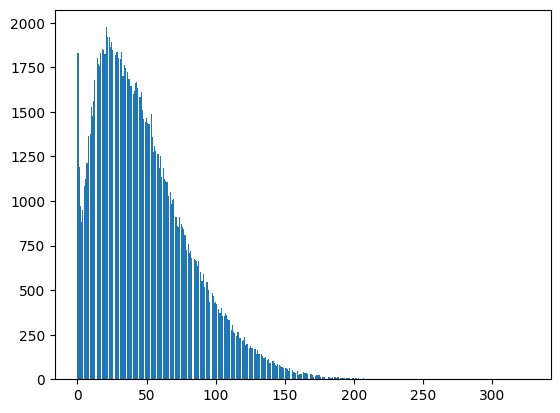

In [8]:
plt.hist(df['Count'], 400);

#### Takto vypadají počty foci v buňkách pro jednotlivé jamky.
#### Otázkou nyní je, jestli by se dala spojit dohromady data z jamek, které obsahují stejnou sloučeninu:

C:\Users\lordo\AppData\Local\Programs\Python\Python310\lib\site-packages\plotnine\stats\stat_bin.py:109: PlotnineWarning: 'stat_bin()' using 'bins = 188'. Pick better value with 'binwidth'.


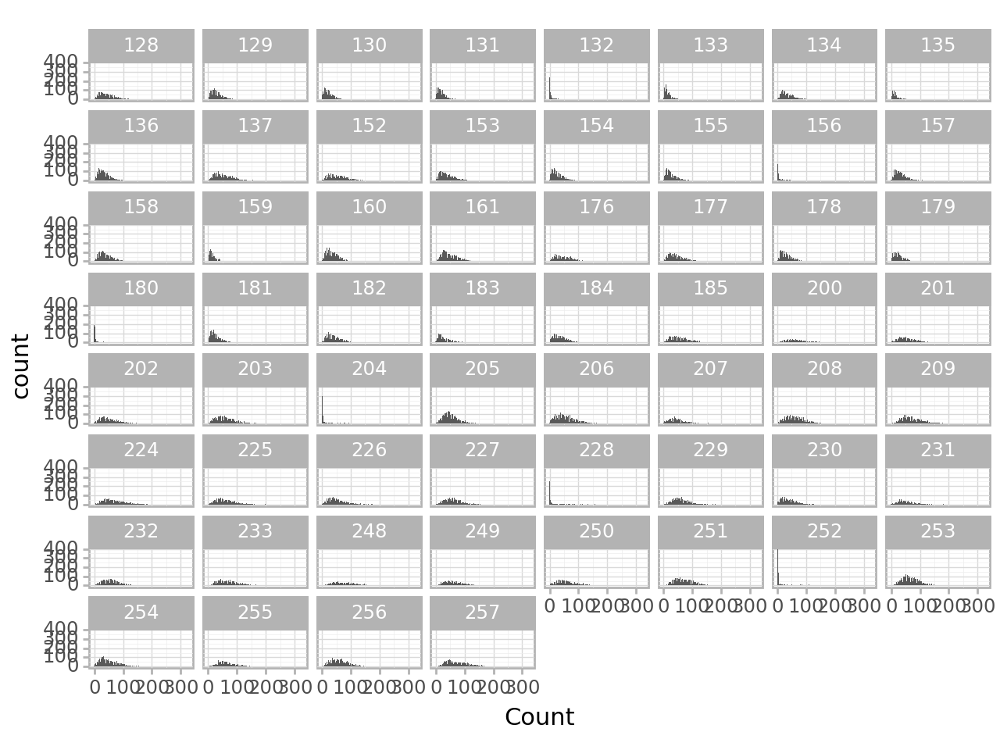

<Figure Size: (640 x 480)>

In [9]:
(ggplot(df)
 + aes(x = 'Count')
 + geom_histogram()
 + facet_wrap('Well') # rozdeli podle jamicek na grafy
)

#### Tady je vizuálně pěknější graf, kde jde dobře vidět, jak se liší počty foci v buňkách pro různé sloučeniny a jak se naopak podobají pro stejné (v rámci stejné Dose)
#### Ukážeme si tedy graficky, jak moc jsou si podobná data z jamek se stejnými sloučeninami i dose. První půlka má dose 0 a druhá má dose 100.

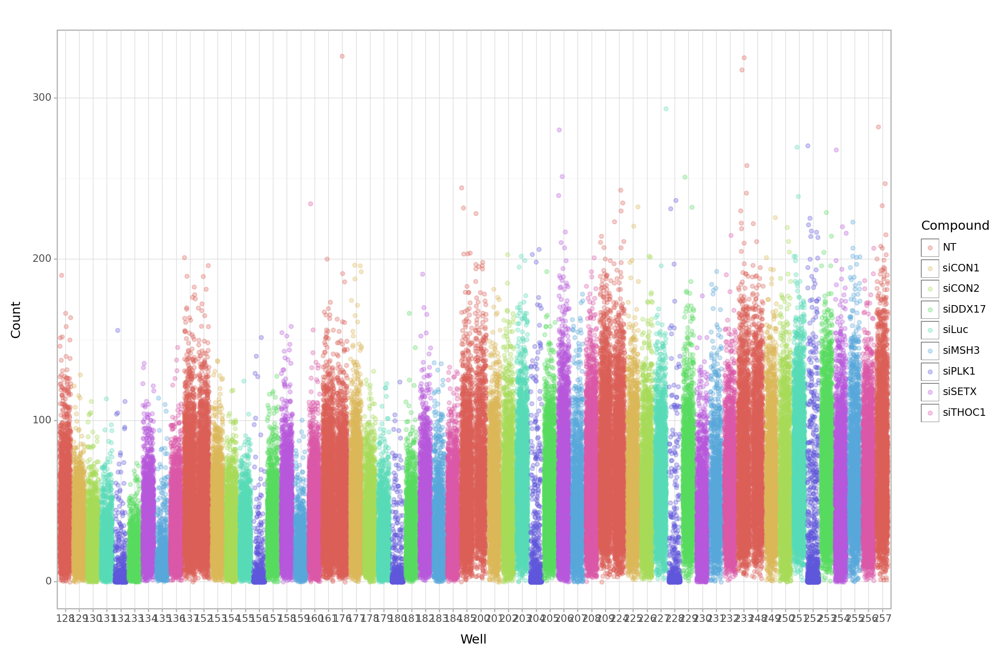

<Figure Size: (1200 x 800)>

In [10]:
(ggplot(df)
 + aes(x="Well", y='Count', color='Compound')
 + geom_jitter(alpha=.3) # jitter = position of the point
 + theme(figure_size=(12,8))
)

#### Vyfiltrujeme si tedy nejdříve data pro Dose = 0. (Na předchozím grafu právě první polovina dat.)

In [11]:
dose_0 = df.query('Dose==0')
dose_0

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
64290,185,100,31,NT,0
64291,185,100,25,NT,0
64292,185,100,30,NT,0
64293,185,100,28,NT,0


In [12]:
nt = dose_0.query("Compound=='NT'")

In [13]:
nt

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
64290,185,100,31,NT,0
64291,185,100,25,NT,0
64292,185,100,30,NT,0
64293,185,100,28,NT,0


#### Takto to vypadá rozdělené podle jednotlivých compounds

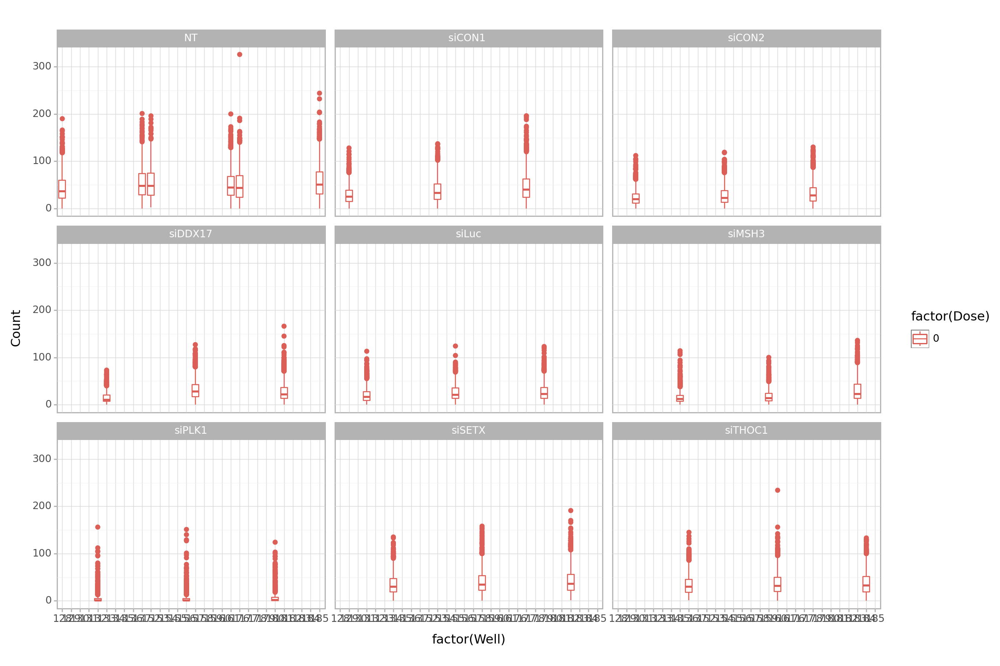

<Figure Size: (1200 x 800)>

In [16]:
(
    ggplot(dose_0, aes(x='factor(Well)', y='Count',  color='factor(Dose)'))
    #+ geom_point()
    #+ geom_jitter(alpha=.3)
    + geom_boxplot()
    + facet_wrap('Compound')
    + labs(x='factor(Well)', y='Count')
    + theme(figure_size=(12,8))
)

#### Podíváme se nyní blíže na naměřená data z jamek obsahujících kontrolu

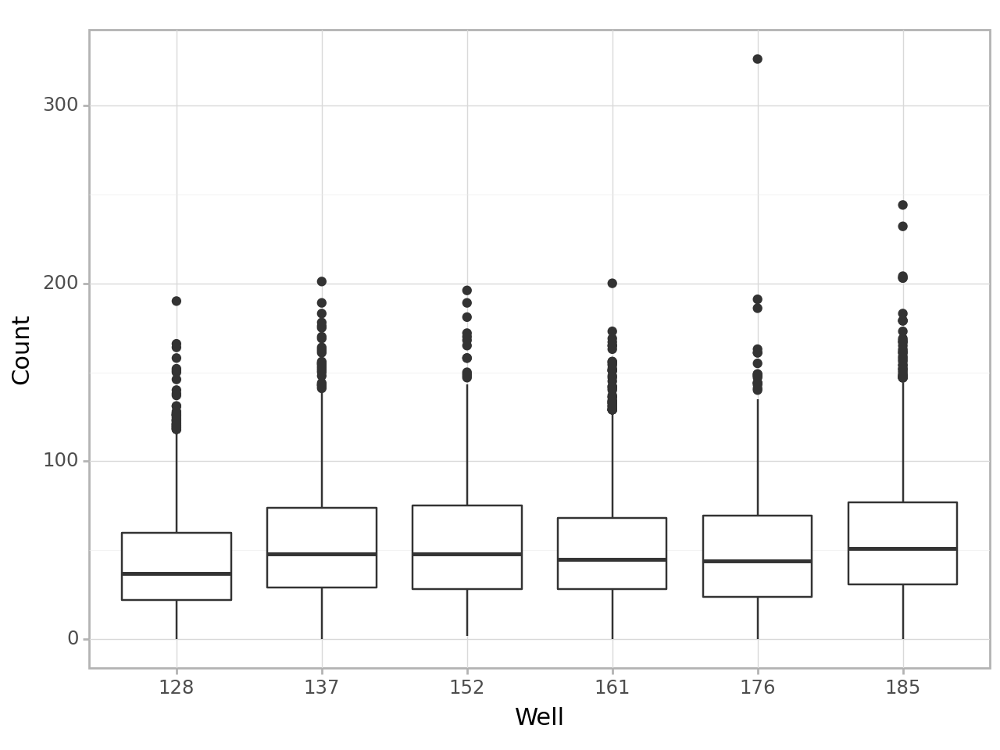

<Figure Size: (640 x 480)>

In [17]:
(ggplot(nt)
 + aes(x = 'Well', y='Count')
 + geom_boxplot()
)

#### Začneme tak, že se zaměříme na první z jamek obsahujících kontrolu. Pro tuto jamku najdeme co nejlepší předpis její empirické distribuce. 
#### Následně provedeme KS test, abychom zjistili, jestli tato distribuce naše data vystihuje dostatečně dobře.

#### Budeme tedy pracovat s jamkou 128, na které si ukážeme celý postup

In [ ]:
well_128 = df.query('Well==128')

#### Ukažme si histogram X v této jamce:

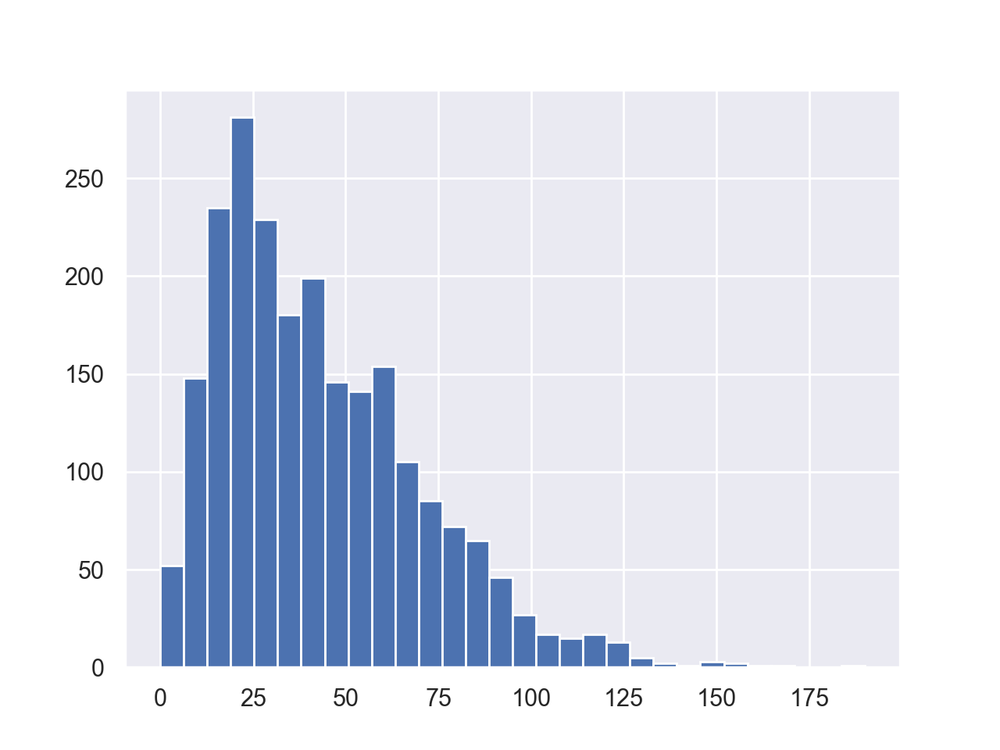

In [21]:
plt.hist(well_128['Count'], bins=30);

#### Vypadá to, že by X v jamce mohlo být poissonovsky rozdělené. 
#### Chceme si to ale ověřit. Ověříme si to pomocí KS testu.

Takto probíhá procedura KS testu:

<div>
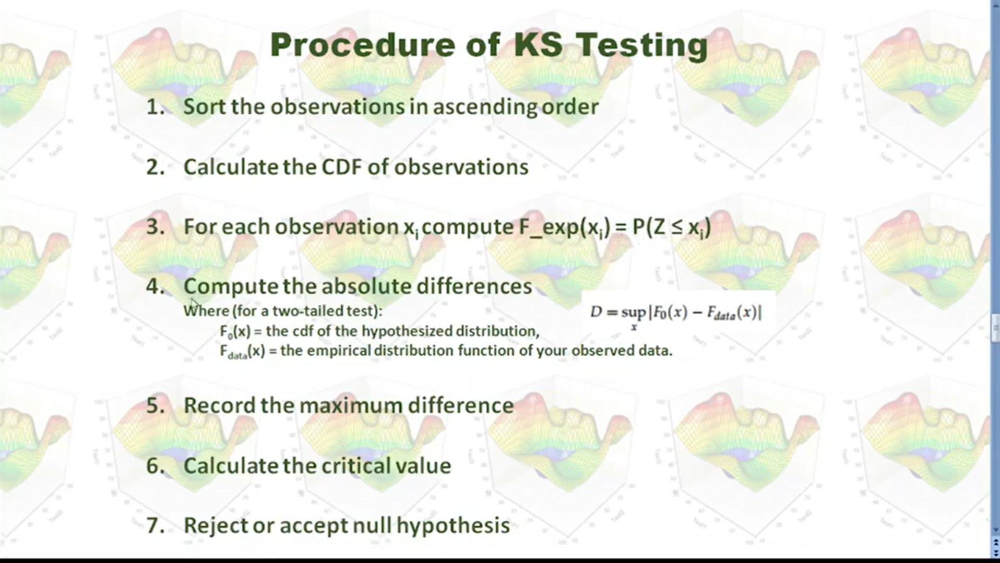
</div>

<div>
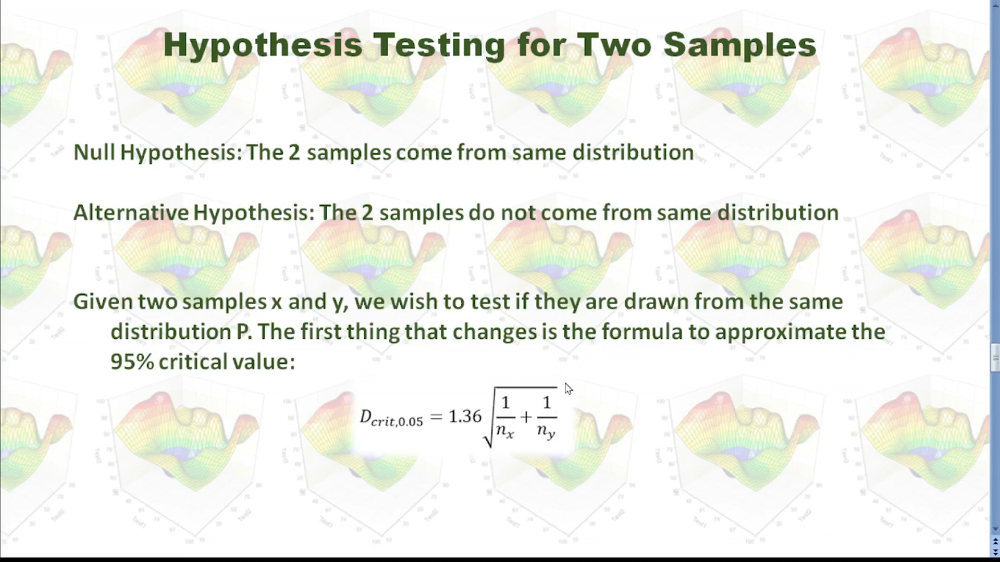
</div>

#### Není možné jen tak porovnat empirickou distribuci s její teoretickou distribucí. Jelikož to, jak moc se 
#### na grafu podobají, je přímo ovlivněné hustotou histogramu a byla by alchymie se to snažit na sebe napasovat. Ukázka:

In [18]:
def fit_poisson(data=None, mu=None, bins_=30):
    sns.set_theme()
    fig, ax = plt.subplots(1, 1)

    x = np.arange(poisson.ppf(0.01, mu),
                  poisson.ppf(0.99, mu))
    
    sns.histplot(data, stat='probability', bins=bins_)
    
    plt.plot(x, poisson.pmf(x, mu))

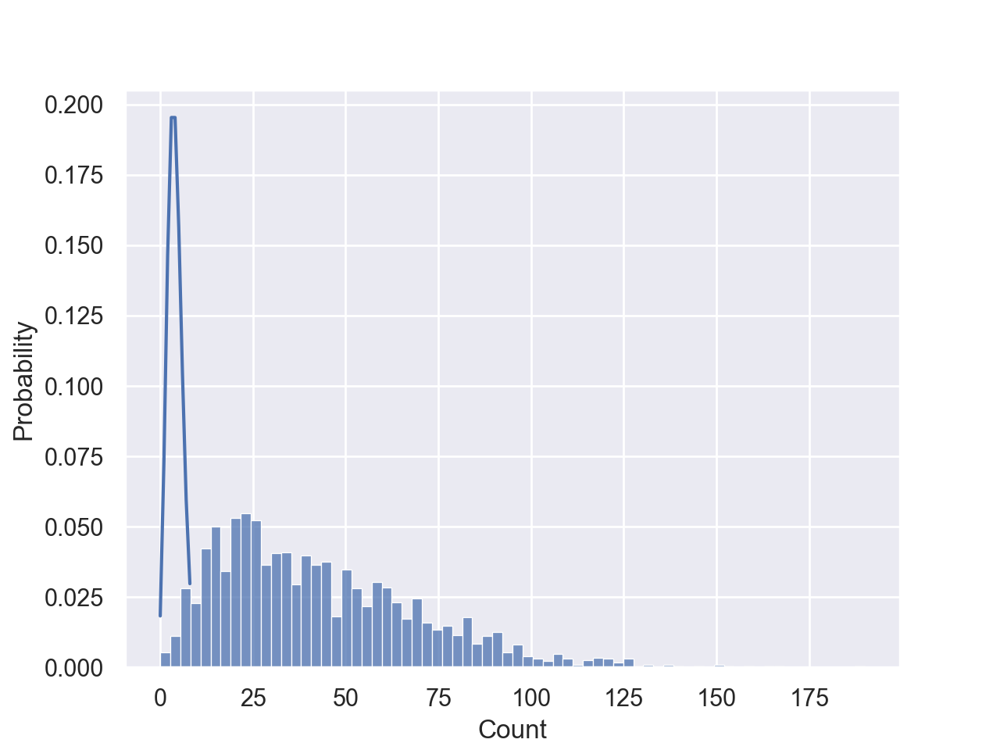

In [19]:
data_ = well_128['Count']
fit_poisson(data_, mu=4, bins_=70)

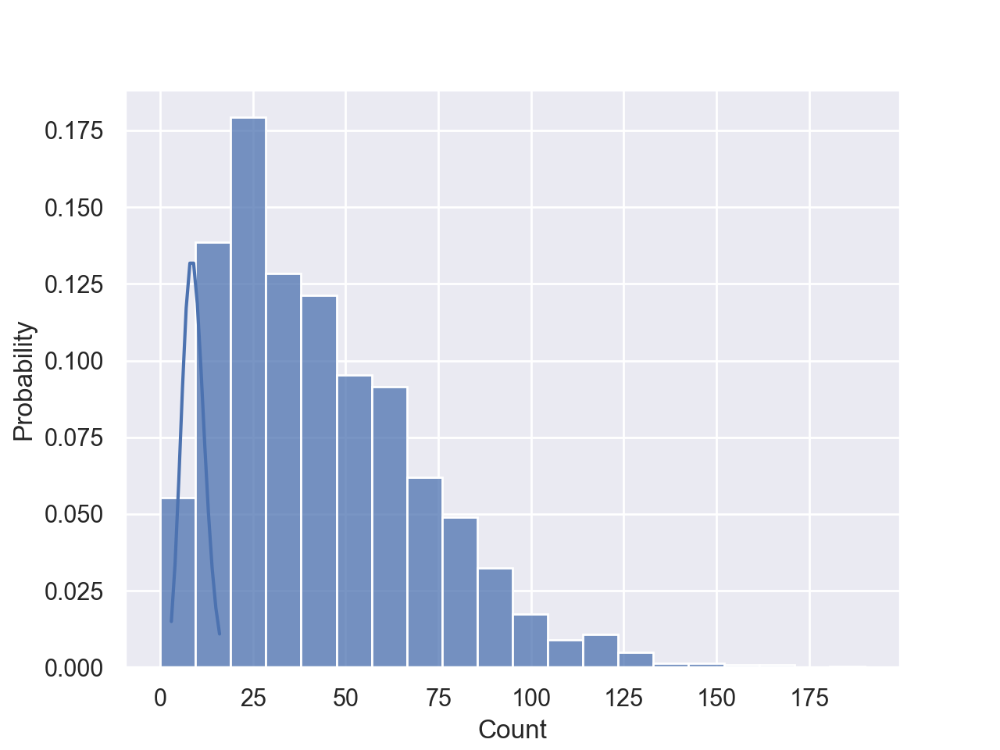

In [20]:
fit_poisson(data_, mu=9, bins_=20)

#### Na těchto grafech vidíme, že tvar, který empirická distribuce má, je silně ovlivněn tím, jak velké obdelníčky si zvolíme do histogramu.
#### Proto na sebe budeme fitovat distribuční funkce.

In [22]:
# !pip install distfit
# from distfit import distfit


# # Lets suppose that X is our data.
# X = well_128['Count']

# # Initialize with default settings
# model= distfit(bound='both')

# # Fit to find the best theoretical distribution 
# model.fit_transform(X)

# model.plot(
#           pdf_properties={'color': 'r', 'linewidth': 4},
#           bar_properties={'color': '#1e3f5a', 'edgecolor': 'k'})

## Pravděpodobnostní funkce X (Probability function)

In [44]:
# mu = 5
# sigma = 1
# seed(0)
# step=2
# poisson_cdf = 1-st.poisson.cdf(mu, arr_1_sorted)

In [30]:
data = well_128['Count']
data_ = [i for i in data_]
mysize = len(data_)
ll = [i for i in range(mysize)]

#### Takto vypadají přímo naše naměřené hodnoty X se svou pravděpoodobností na ose Y

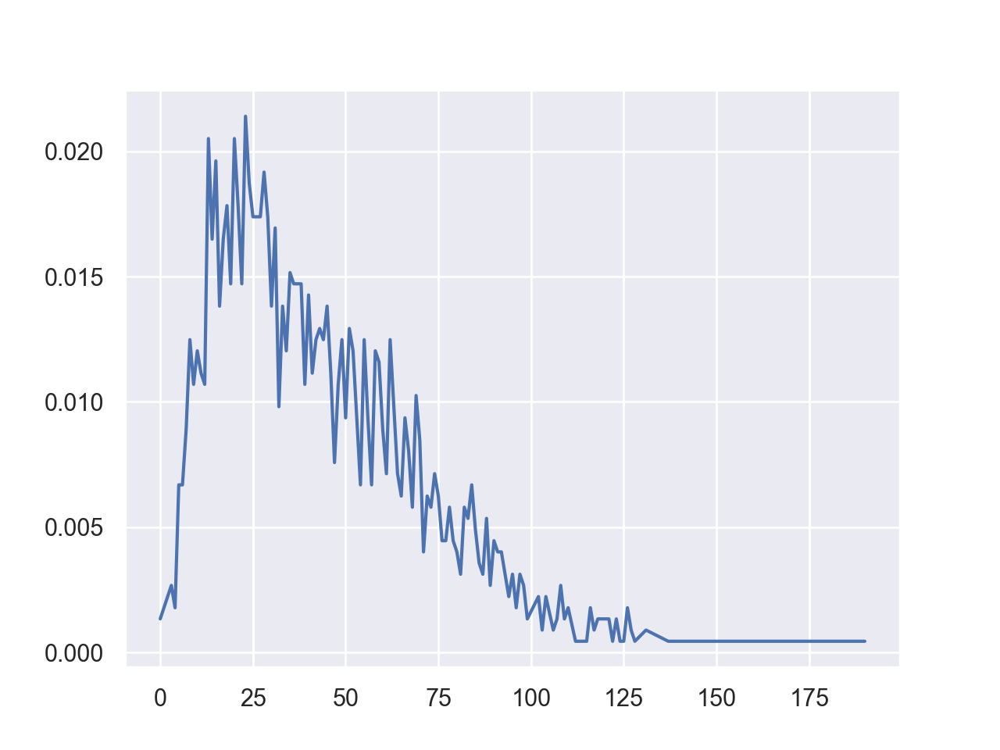

In [32]:
k = list(set(data_))
pmf = [data_.count(i)/len(data_) for i in k] #Probability mass function
   
plt.plot(k, pmf) 
plt.show()

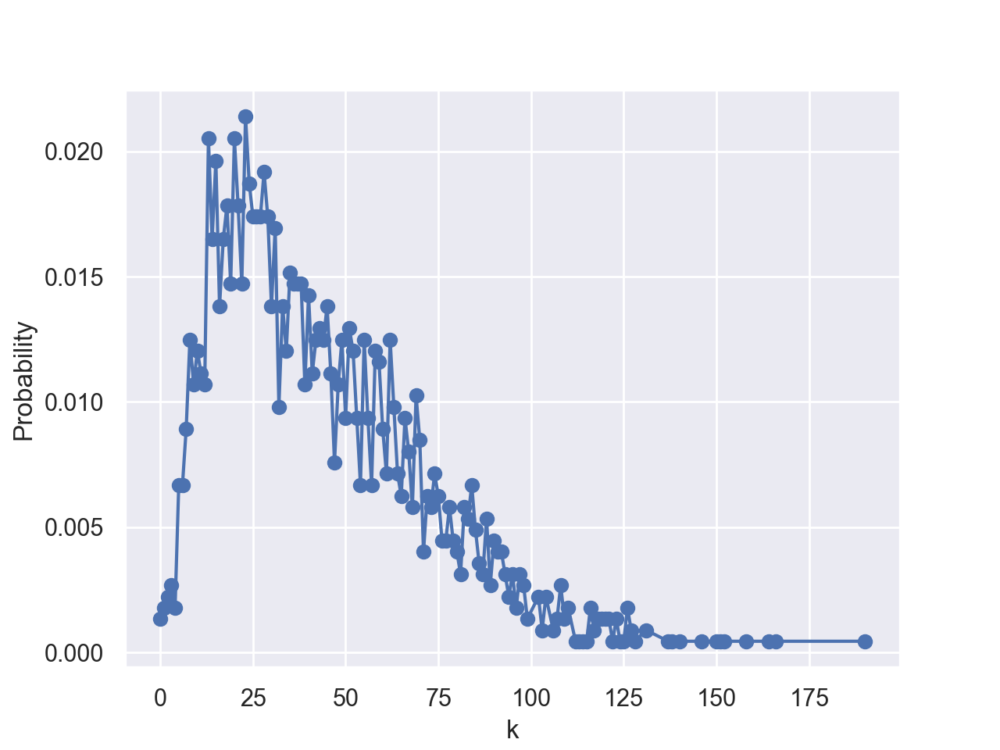

In [33]:
plt.plot(k, pmf, marker='o')
plt.xlabel('k')
plt.ylabel('Probability')

plt.show()

## Distribuční funkce (cumulative distribution function)


In [34]:
cdf = []
sum_ = 0
for i in pmf:
    sum_ += i
    cdf.append(sum_)
#     mohli bychom pouzit take log cdf, abychom data "vyrovnali"

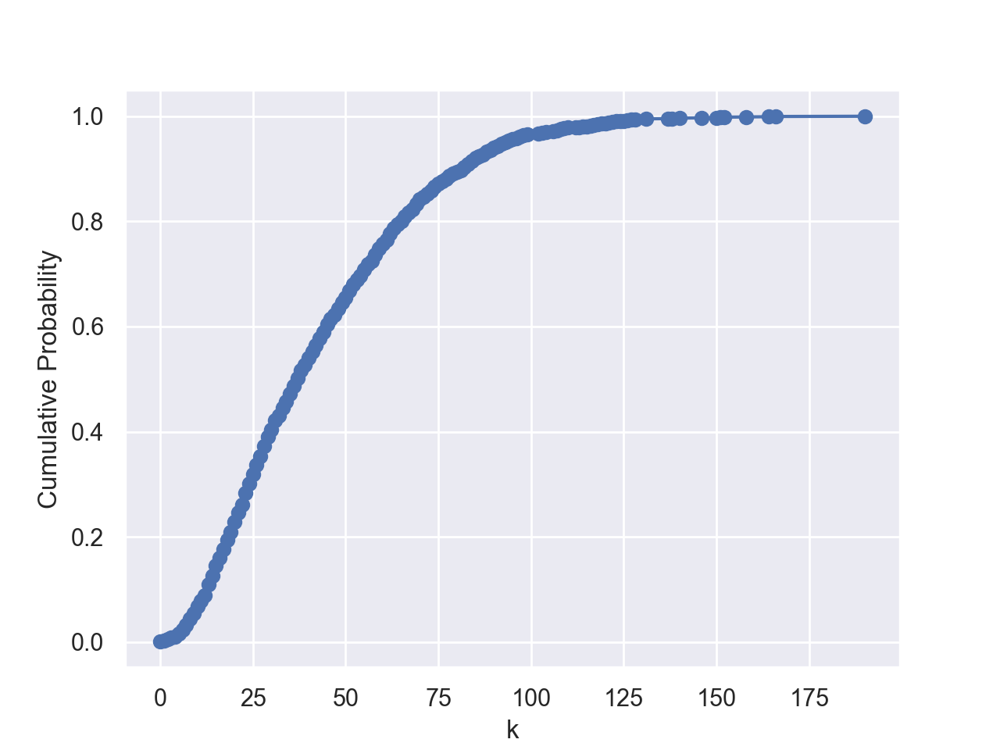

In [35]:
plt.plot(k, cdf, marker='o')
plt.xlabel('k')
plt.ylabel('Cumulative Probability')

plt.show()

#### Získali jsme nyní distribuční funkci pro hustotní funkci počtu buněk pro různé počty foci. (distribuční funkci pro X)

#### Nyní si zkusíme udělat distribuční funkci z teoretické poissonovské distribuce (nikoli empirické).

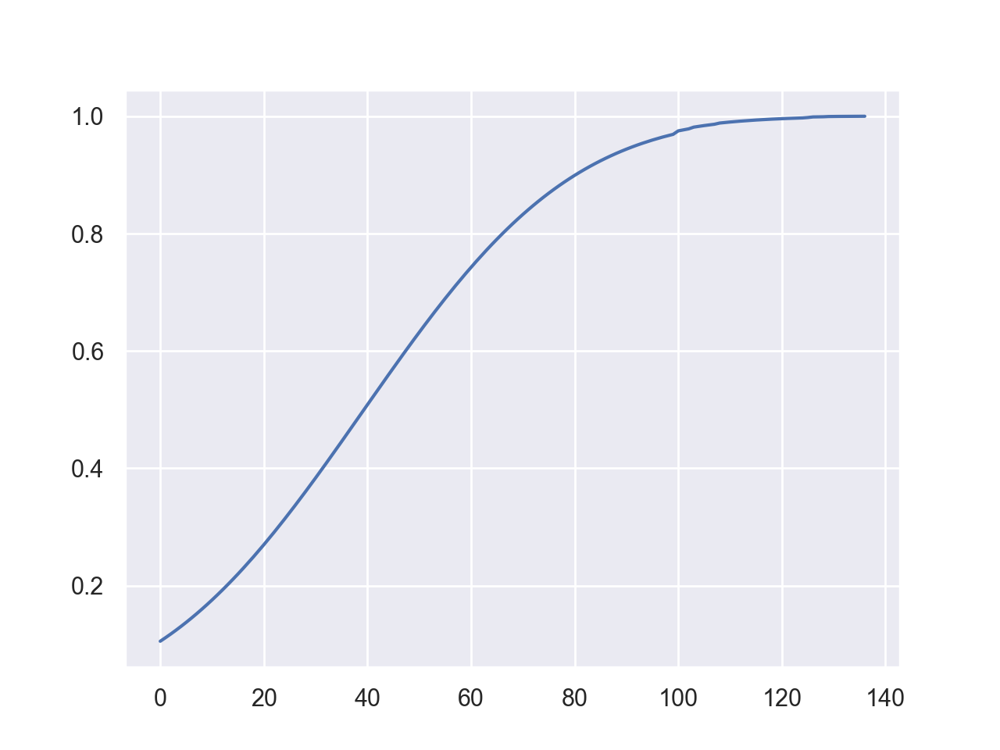

In [36]:
mu = 1000
loc = -960
y = scipy.stats.poisson.cdf(k, mu, loc)
# plotting the graph
plt.plot(y)
# showing the graph
plt.show()

#### Obojí na stejném grafu:

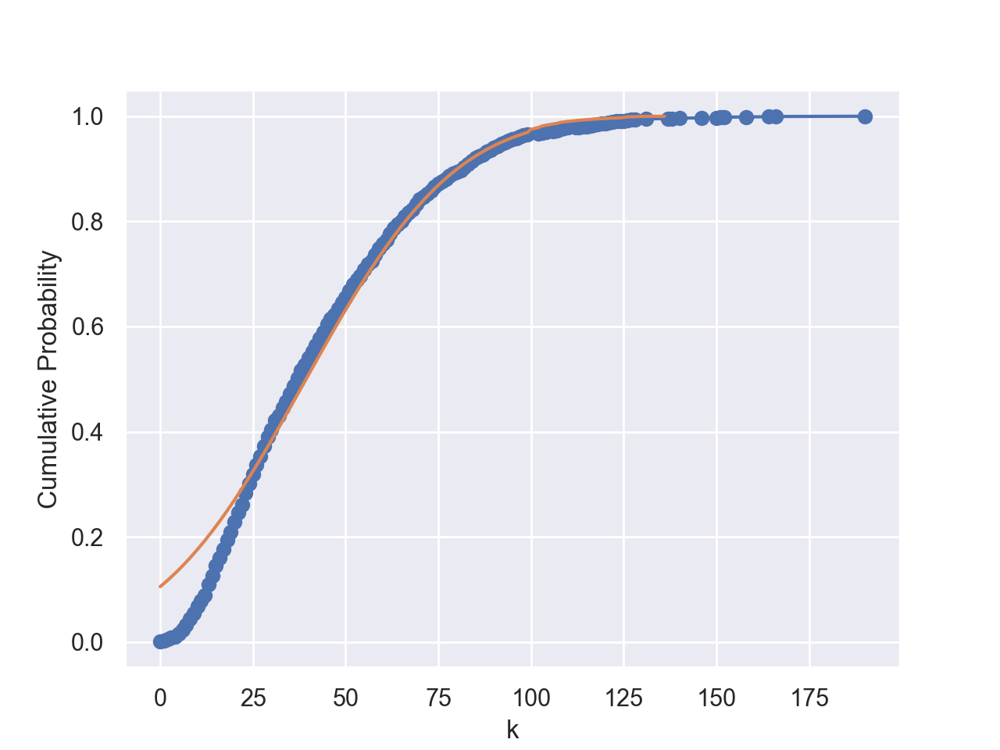

In [37]:
plt.plot(k, cdf, marker='o')
plt.xlabel('k')
plt.ylabel('Cumulative Probability')
plt.plot(y)

plt.show()

#### Zkusíme najít parametry, pro které jsou si nejblíže.
K tomu jsem chtěla použít SGD, ale nedařilo se mi to, takže použiju grid search.

Abychom ale poznali, jak moc jsou distribuce rozdílné, potřebujeme nějakou metriku - a použijeme max(y-difference)

## SGD (does not work)

In [23]:
import argparse
import numpy as np
import sklearn.datasets
import sklearn.metrics
import sklearn.model_selection
import math
import matplotlib
import matplotlib.pyplot as plt
from scipy.special import factorial
# import random.poisson

In [24]:
plot = True
batch_size = 10
learning_rate = 0.1
epochs = 2
size = 1000
X_train = k
y_train = cdf
lambda_ = 200
loc = -200


def sigmoid(x):
    return 1 / (1 + np.exp(-x))
for _ in range(epochs):
    for idx, ii in enumerate(k):
        data = np.array([ii, 1])
        weights = np.transpose(np.array([lambda_, loc]), axes=None)
        target = y_train[idx]

        # Reshape data and weights
        data = data.reshape(1, -1)
        weights = weights.reshape(-1, 1)

        gradient = (sigmoid(data @ weights) - target) @ data
        # gradient /= 1
        # print(gradient)
        weights = weights - learning_rate * gradient
        lambda_ = weights[0][0]
        loc = weights[0][1]


        y_pred_train = sigmoid(((lambda_**(ii-loc))*((math.e)**(-lambda_)))/factorial(ii-loc))
        train_loss = (target - y_pred_train)**2
        train_accuracy = target - y_pred_train


        # print("After epoch", (ii +1), ": train loss", train_loss, "lambda", lambda_)

if plot:
    plt.plot(k, cdf, marker='o')
    plt.xlabel('k')
    plt.ylabel('Cumulative Probability')
    yy = scipy.stats.poisson.cdf(k, lambda_, loc)
    plt.plot(yy)

    plt.show()
    print(lambda_, loc)

NameError: name 'k' is not defined

In [ ]:
import numpy as np
import scipy.stats
import matplotlib.pyplot as plt

plot = True
learning_rate = 0.01
epochs = 100
batch_size = 10
X_train = np.array(k)
y_train = np.array(cdf)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Initialize parameters with random values
lambda_ = np.random.rand()
loc = np.random.rand()

num_samples = len(X_train)
num_batches = num_samples // batch_size

for epoch in range(epochs):
    # Shuffle the data
    indices = np.random.permutation(num_samples)
    X_train_shuffled = X_train[indices]
    y_train_shuffled = y_train[indices]

    for batch in range(num_batches):
        start = batch * batch_size
        end = start + batch_size
        X_batch = X_train_shuffled[start:end]
        y_batch = y_train_shuffled[start:end]

        # Compute the gradients for the batch
        gradients = np.zeros(2)
        for i in range(len(X_batch)):
            data = np.array([X_batch[i], 1])
            weights = np.array([lambda_, loc])
            target = y_batch[i]

            gradient = (sigmoid(np.dot(data, weights)) - target) * data
            gradients += gradient

        # Update the parameters
        lambda_ -= learning_rate * gradients[0] / batch_size
        loc -= learning_rate * gradients[1] / batch_size

    total_loss = 0
    total_accuracy = 0
    for idx, ii in enumerate(X_train):
        data = np.array([ii, 1])
        y_pred_train = scipy.stats.poisson.cdf(ii, lambda_, loc)
        target = y_train[idx]
        loss = (target - y_pred_train) ** 2
        accuracy = target - y_pred_train
        total_loss += loss
        total_accuracy += accuracy

    avg_loss = total_loss / num_samples
    avg_accuracy = total_accuracy / num_samples
    print("Epoch:", epoch + 1, "Average Loss:", avg_loss, "Average Accuracy:", avg_accuracy)

if plot:
    plt.plot(X_train, y_train, marker='o')
    plt.xlabel('k')
    plt.ylabel('Cumulative Probability')
    yy = scipy.stats.poisson.cdf(X_train, lambda_, loc)
    plt.plot(X_train, yy)

plt.show()
print(lambda_, loc)

## KS test

KS Statistic: The KS statistic measures the maximum vertical distance (or absolute difference) between the empirical cumulative distribution function (ECDF) of the sample data and the cumulative distribution function (CDF) of the theoretical distribution being tested. It quantifies the largest discrepancy between the two distributions. The KS statistic is a numerical value that indicates how well the sample data aligns with the theoretical distribution. A smaller KS statistic suggests a better fit between the two distributions.

The critical value in the KS test is a threshold that determines whether the computed test statistic is statistically significant or not. It defines the level of discrepancy between the distributions that is considered significant. By comparing the test statistic with the critical value, the test decides if the distributions are significantly different or not.

In [50]:
mu = 1000
loc = -960
empirical_distribution = k, cdf
theoretical_distribution = scipy.stats.poisson.cdf(k, mu, loc)

#### Spočítáme absolutní hodnoty vertikálních rozdílů distribucí

In [55]:
#calculate absolute difference
arr_dif_abs_poisson = np.abs(cdf-scipy.stats.poisson.cdf(k, mu, loc))
print("Difference relative to theoretical poisson distribution")
print(arr_dif_abs_poisson)

Difference relative to theoretical poisson distribution
[1.03919226e-01 1.08090470e-01 1.12051094e-01 1.15803707e-01
 1.20688019e-01 1.20910015e-01 1.21375203e-01 1.19855325e-01
 1.15013317e-01 1.12199092e-01 1.08291261e-01 1.05517893e-01
 1.03431538e-01 9.17759104e-02 8.43690788e-02 7.40744764e-02
 6.98049123e-02 6.30852087e-02 5.52479221e-02 5.07458740e-02
 4.06563921e-02 3.34436895e-02 2.95464815e-02 1.91488399e-02
 1.16050858e-02 5.56909781e-03 3.05713594e-04 6.02888973e-03
 1.33937207e-02 1.88439162e-02 2.06068818e-02 2.53811619e-02
 2.29240149e-02 2.43928878e-02 2.40038761e-02 2.66732401e-02
 2.88466165e-02 3.09822624e-02 3.30927044e-02 3.11780485e-02
 3.28300443e-02 3.13738219e-02 3.12802476e-02 3.16701225e-02
 3.16641230e-02 3.30577537e-02 3.18505137e-02 2.71624919e-02
 2.56926489e-02 2.61146831e-02 2.35353151e-02 2.46525299e-02
 2.50181438e-02 2.28585554e-02 1.81830597e-02 1.94712989e-02
 1.78150176e-02 1.36679348e-02 1.50624035e-02 1.62094868e-02
 1.48863761e-02 1.19905512e-0

#### následující graf ukazuje abslutní hodnotu vertikálního rozlílu distribucí pro kažké k

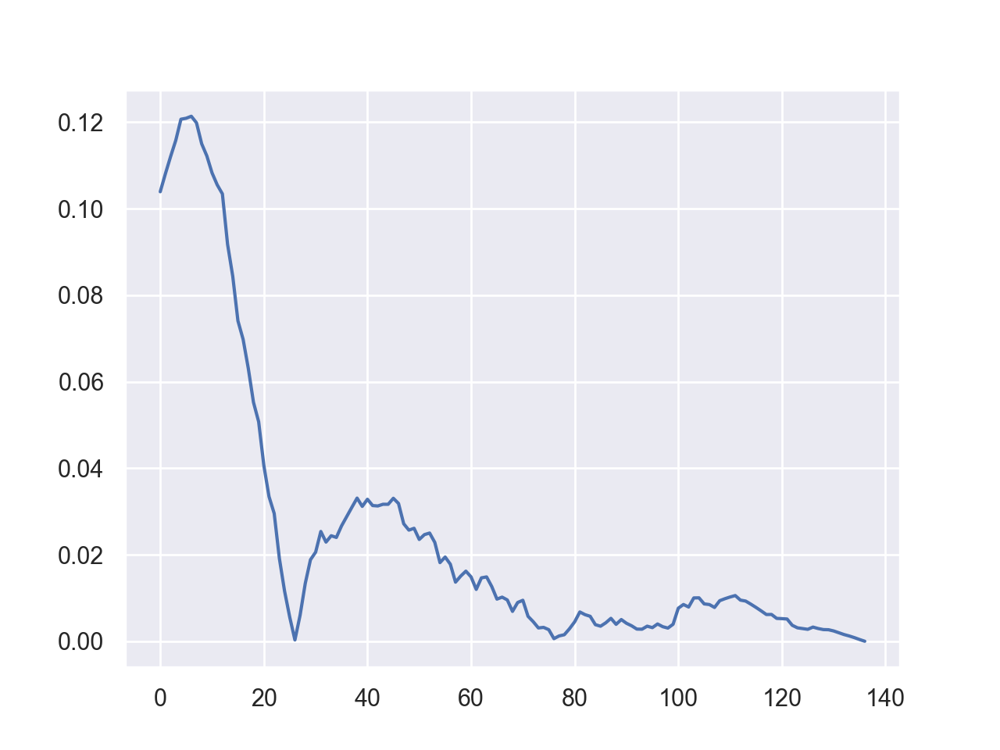

In [56]:
plt.plot(arr_dif_abs_poisson)
plt.show()

#### Nyní najdeme maximum tohoto grafu

In [66]:
#get max difference
ps_ks = max(arr_dif_abs_poisson)
print("Maximum difference relative to theoretical poisson distribution:{}".format(ps_ks))
print("Tohle je naše KS statistika")

Maximum difference relative to theoretical poisson distribution:0.12137520257248452
Tohle je naše KS statistika


#### Uděláme si funkci na výpočet této KS statistiky pro libovolné parametry teoretické poissonovské distribuční funkce:

In [80]:
def get_D(lambda_, loc):
    global k
    global cdf
    empirical_distribution = k, cdf
    theoretical_distribution = scipy.stats.poisson.cdf(k, lambda_, loc)
    #calculate absolute difference
    arr_dif_abs_poisson = np.abs(cdf-scipy.stats.poisson.cdf(k, lambda_, loc))
    #get max difference
    ps_ks = max(arr_dif_abs_poisson)
    
    return ps_ks

In [60]:
mySize = len(k)

#### Nyní vypočítáme critical value poissonovské distribuce

The concept of critical value in the context of the Kolmogorov-Smirnov (KS) test for comparing a theoretical and empirical Poisson distribution.

The critical value is a threshold value that is used to determine whether the KS test statistic is significant or not. It helps in making a decision about rejecting or accepting the null hypothesis. In the KS test, the null hypothesis assumes that the empirical data is drawn from the theoretical distribution being tested (in this case, the Poisson distribution).

To find the critical value, we need to specify the desired significance level (often denoted as alpha), which indicates the threshold for determining statistical significance. Common choices for alpha are 0.05 (5%) or 0.01 (1%). The significance level represents the probability of rejecting the null hypothesis when it is actually true.

In Python, we can find the critical value for the KS test using the scipy.stats.kstwobign function, which is based on the Kolmogorov-Smirnov distribution. 

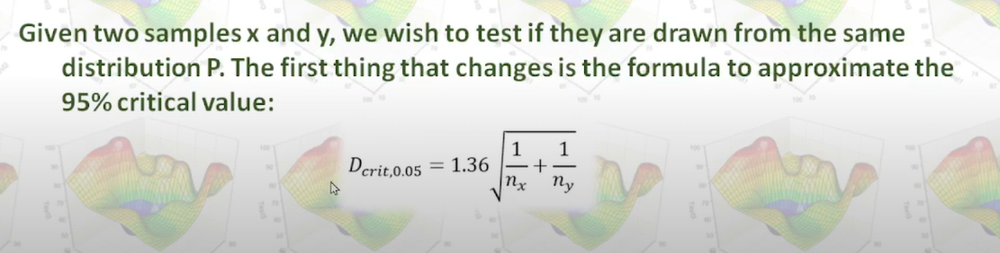

In [76]:
D_critial=1.36 * np.sqrt(2/mysize)
print("Critical value at 95% confidence interval:{}".format(D_critial))

Critical value at 95% confidence interval:0.040610587226947624


In [78]:
print("naše KS statistika D vyšla:{}".format(ps_ks), "a confidence interval:{}".format(D_critial))

naše KS statistika D vyšla:0.12137520257248452 a confidence interval:0.040610587226947624


#### Naše KS statistika D vyšla:0.12137520257248452 a confidence interval:0.040610587226947624.
#### D tedy přesahuje confidence interval.
#### Možná jsme nezvolili úplně ideální teoretickou distribuci k naměřeným našem datům. Zkusíme parametry distribuce odhadnout šikovněji než 
#### úplně náhodně, použijeme k tomu grid search:

## Grid search (Poisson regression using Grid Search)

In [90]:
best_loc = None
best_lambda = None
best_score = math.inf


for loc in range(-2000, 1301):
    if loc == -1900:
        print("5 procent done")
    for lambda_ in range(-1100, 1501):
        # calculate the max difference between distributions
        score = get_D(lambda_, loc)
        # save if it is the smallest 
        # print(score)
        if score < best_score:
            best_score = score
            best_loc = loc
            best_lambda = lambda_

print(best_lambda, best_loc)

578 -538


In [93]:
def show_approximation():
    global best_lambda
    global best_loc
    global k
    global cdf
    plt.plot(k, cdf, marker='o')
    plt.xlabel('k')
    plt.ylabel('Cumulative Probability')
    yy = scipy.stats.poisson.cdf(k, best_lambda, best_loc)
    plt.plot(yy)

    plt.show()
    print(lambda_, loc)
    print(best_score)

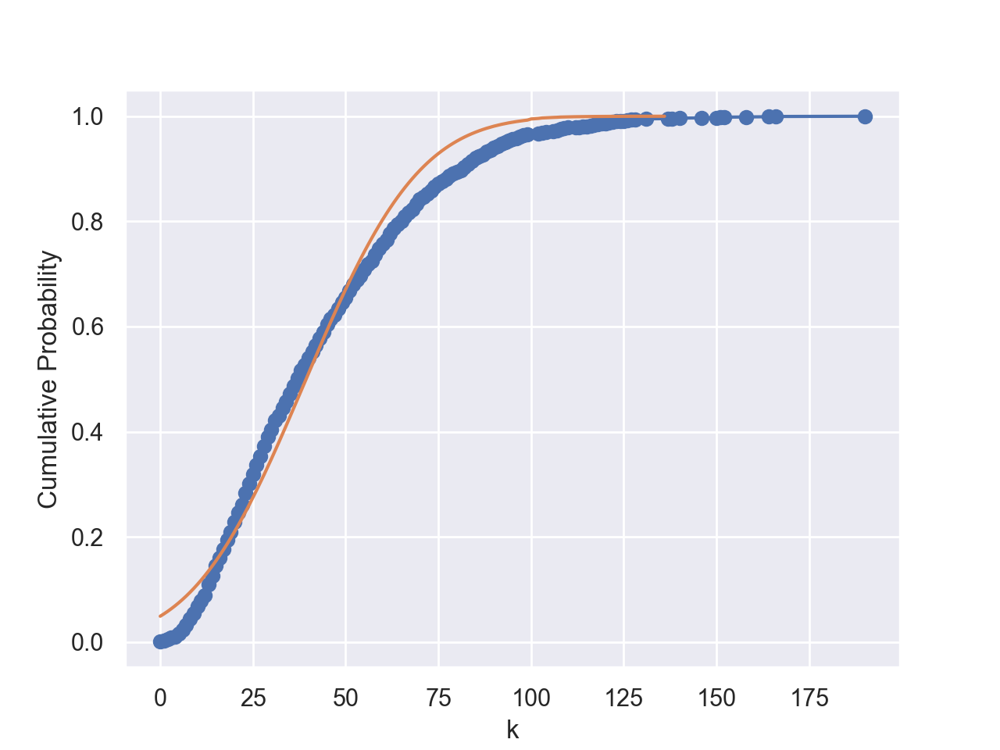

1500 1300
0.05907482204529779
0.05907482204529779


In [95]:
show_approximation()
print(best_score)

#### Nejlepší KS statistika nám vyšla 0.05907482204529779 a to je pořád vyšší než D_critical.
#### Proto zkusíme jemnější hledání hodnot parametrů.

1/3 procent done
578.08 -538.99


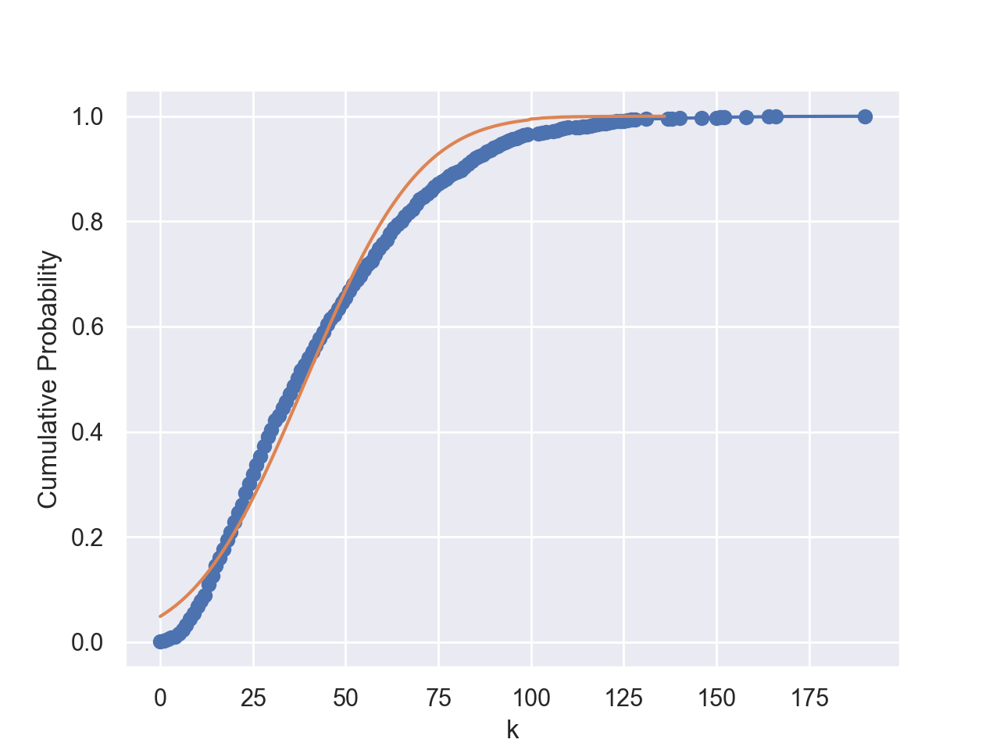

585.99 -532.01
0.05856296120652971


In [97]:
for loc in range(-54400, -53200):
    loc /= 100.0
    if loc == -540:
        print("1/3 procent done")
    for lambda_ in range(57000, 58600):
        lambda_ /= 100.0
        # calculate the max difference between distributions
        score = get_D(lambda_, loc)
        # save if it is the smallest 
        # print(score)
        if score < best_score:
            best_score = score
            best_loc = loc
            best_lambda = lambda_

print(best_lambda, best_loc)
show_approximation()

In [99]:
print("naše KS statistika D vyšla:{}".format(best_score), "a confidence interval:{}".format(D_critial))

naše KS statistika D vyšla:0.05856296120652971 a confidence interval:0.040610587226947624


578.08 -538.99
578.08 -538.99


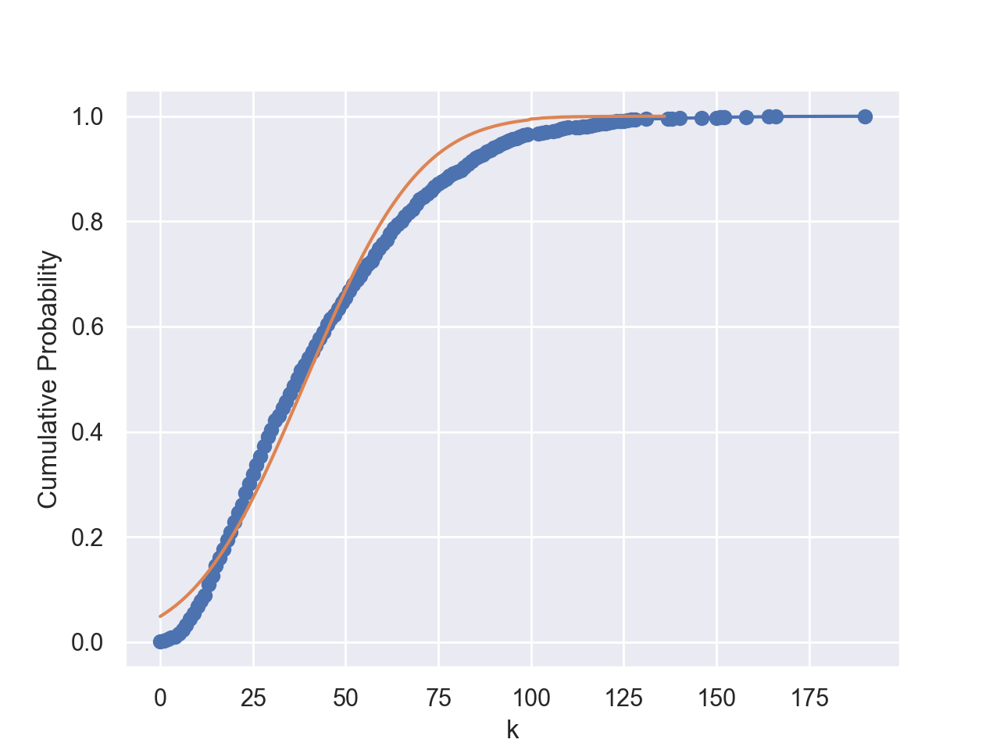

1500000 13000000
0.05856296120652971


In [103]:

for loc in range(-20000000, 13010000, 100000):
    if loc == -1900:
        print("5 procent done")
    for lambda_ in range(-1100000, 1501000, 100000):
        # calculate the max difference between distributions
        score = get_D(lambda_, loc)
        # save if it is the smallest 
        # print(score)
        if score < best_score:
            best_score = score
            best_loc = loc
            best_lambda = lambda_

print(best_lambda, best_loc)
print(best_lambda, best_loc)
show_approximation()

#### Nepomohlo ani hodně rozšířit interval čísel, kterých mohou nabývat parametry.

## Výsledek a diskuze

Právě jsme se dívali na data z jamky well_128, která ukazovala počty foci v jednotlivých buňkách. Jamka obsahuje kontrolu (sloučeninu NT).
Pomocí poissonovské regrese distribuční funkce této distribuce Grid searchem jsme našli nějakou aproximaci předpisem poissonovské distribuce. (aproximace minimalizující max(z-difference))
Nicméně pro $\alpha$ = 0.05 nám vychází, že bychom nulovou hypotézu, že jsou empirická data z poissonovské distribuce, měli odmítnout. 
Otázkou ještě zůstává, jestli bychom třeba nemohli jen o trošku zvýšit  $\alpha$, jelikož by stačil kousek k potvrzení nulové hypotézy. Dále je možné, že jsme nezkusili některé parametry, které by lépe aproximovaly křivku.

Stejným způsobem by se dalo vyhodnotit i ostatní jamky, abychom zjistili, jestli jejich hodnoty mají poissonovské rozdělení. 
Pak by šlo porovnat navzájem jamky se stejnými sloučeninami a stejnou "dose". Jejich distribuce by měly podle předpokladu vycházet stejně

## delete?

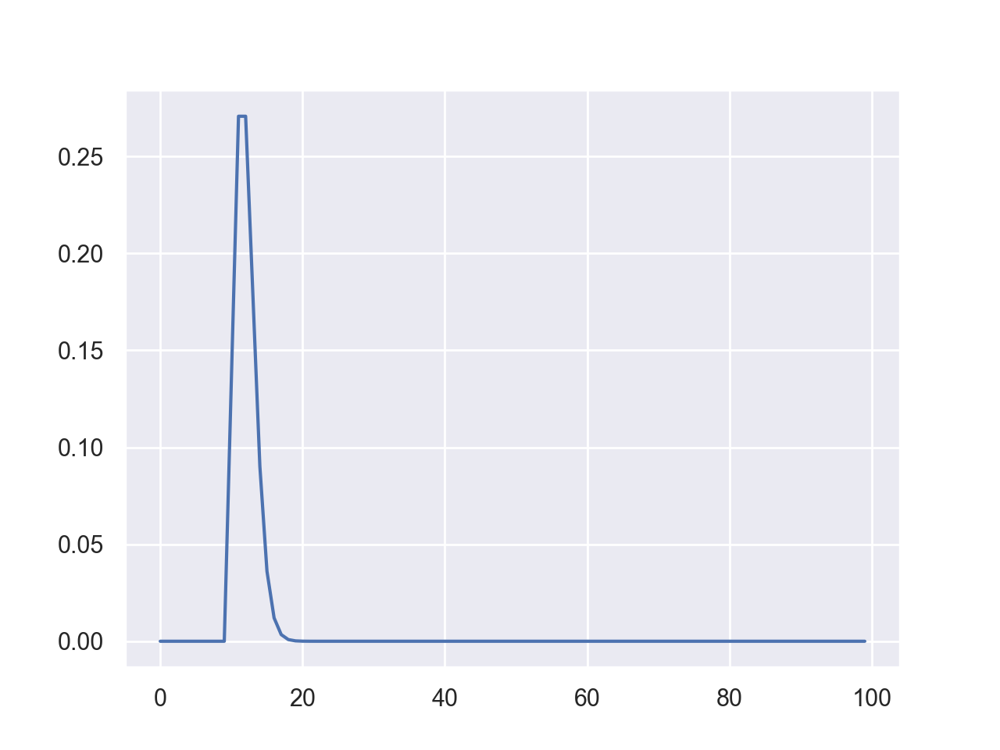

In [47]:
# importing poisson from scipy
from scipy.stats import poisson
 
# importing numpy as np
import numpy as np
 
# importing matplotlib as plt
import matplotlib.pyplot as plt
 
 
# creating a numpy array for x-axis
# using step size as 1
x = np.arange(0, 100, 1)
 
# poisson distribution data for y-axis
y = poisson.pmf(x, mu=2, loc=10)
 
 
# plotting the graph
plt.plot(x, y)
 
# showing the graph
plt.show()

# idk

Scukneme vždy 3 jamky se stejnou compound a 0 nebo 100

In [48]:
df_deep_copy = df.copy()
df_deep_copy

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
137638,257,100,106,NT,100
137639,257,100,70,NT,100
137640,257,100,282,NT,100
137641,257,100,58,NT,100


In [49]:
dict = {}
for row in df_deep_copy.iterrows():
    print(row)
    key = row['Compound']
    if key in dict.keys():
        dict[key] = dict[key].append((row['Count'], row['Dose']))
    else:
        dict[key] = []

(0, Well         128
AreaIndex      1
Count          2
Compound      NT
Dose           0
Name: 0, dtype: object)


TypeError: tuple indices must be integers or slices, not str

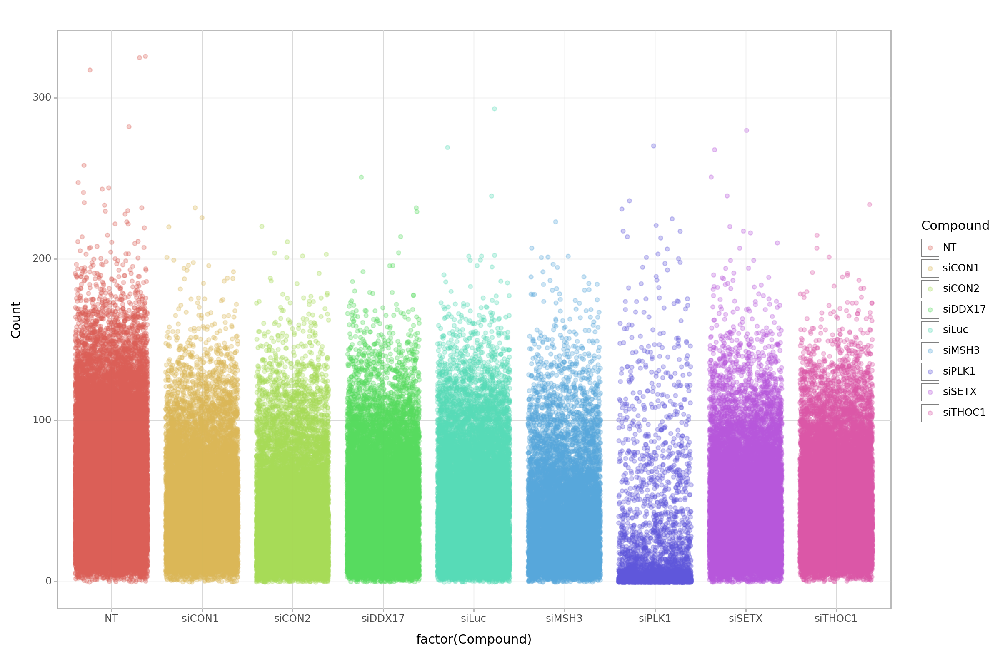

<Figure Size: (1200 x 800)>

In [50]:
(ggplot(df)
 + aes(x="factor(Compound)", y='Count', color='Compound')
 + geom_jitter(alpha=.3)
 + theme(figure_size=(12,8))
)

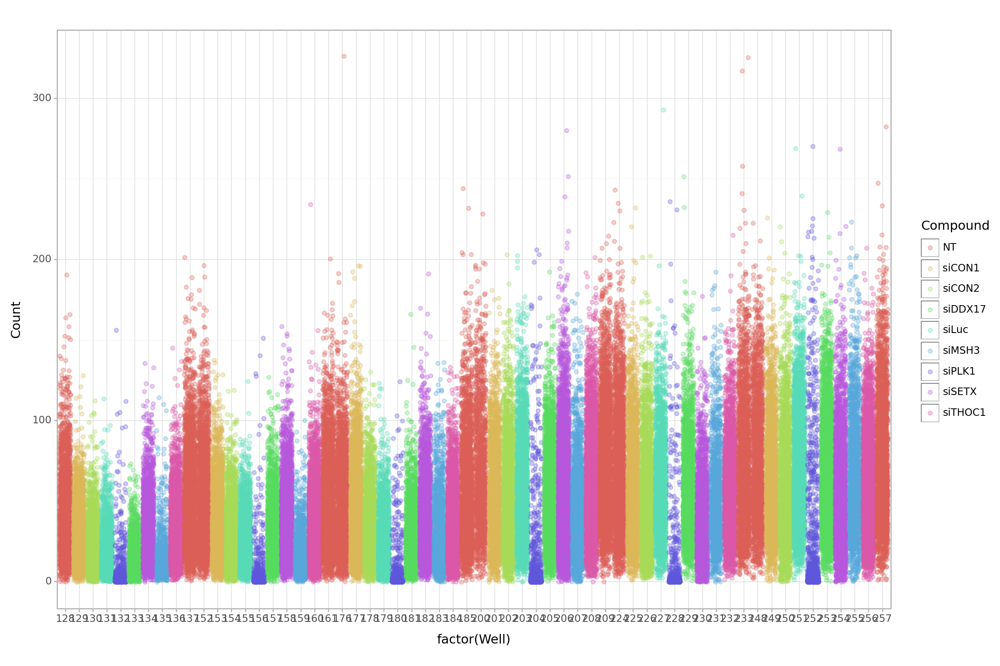

<Figure Size: (1200 x 800)>

In [51]:
(ggplot(df)
 + aes(x='factor(Well)', y='Count', color='Compound')
 + geom_jitter(alpha=.3)
 + theme(figure_size=(12,8))
)

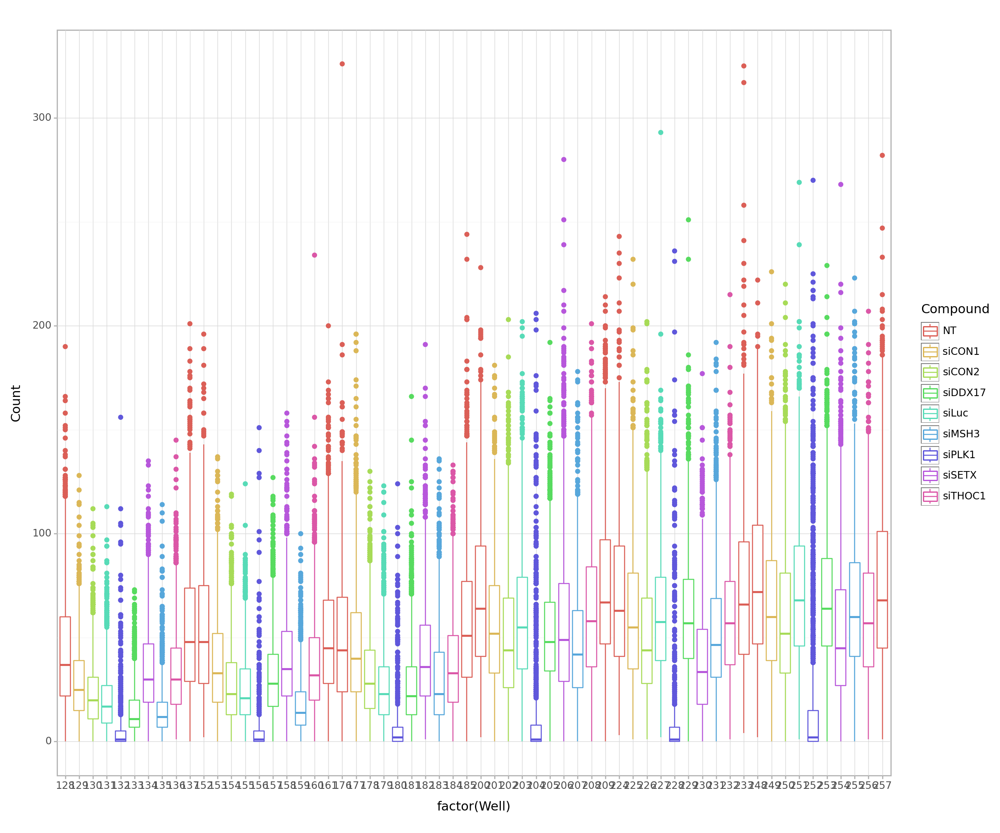

<Figure Size: (1200 x 1000)>

In [52]:
(ggplot(df)
 + aes(x='factor(Well)', y='Count', color='Compound')
 + geom_boxplot()
 + theme(figure_size=(12,10))
)

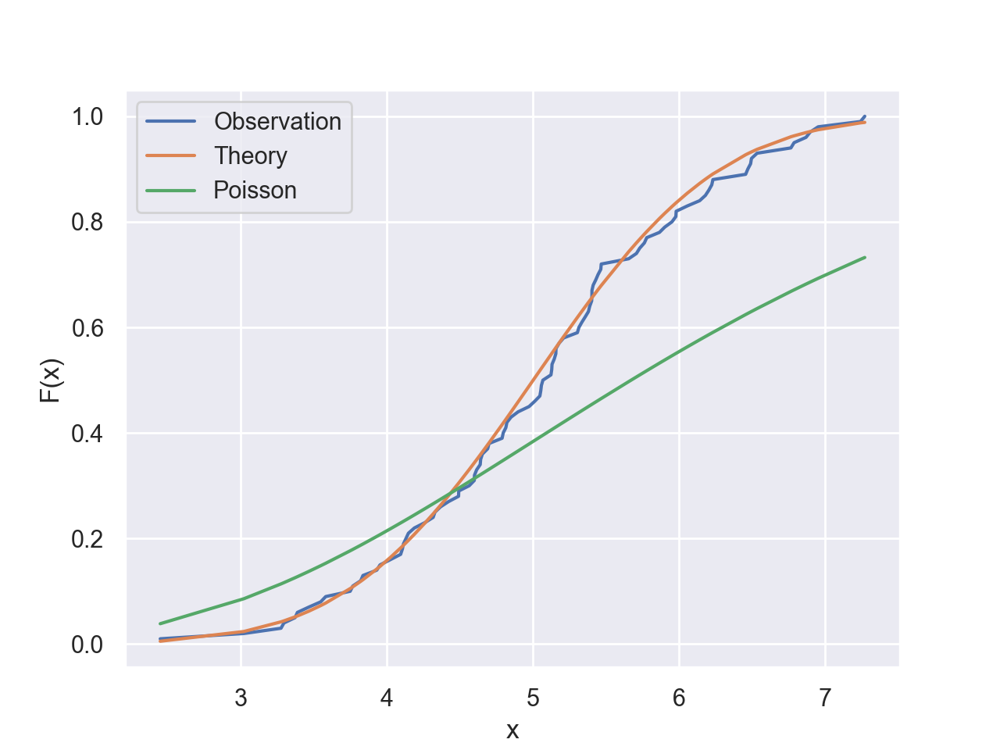

Difference relative to normal distribution
[0.00465987 0.00380705 0.01214829 0.00397889 0.00152979 0.00672521
 0.00776069 0.00707752 0.01219877 0.0051401  0.00155233 0.00112556
 0.00802083 0.00214034 0.00280804 0.0042158  0.01212452 0.00526887
 0.00267199 0.00806754 0.01347403 0.0119329  0.00100632 0.00673188
 0.00064531 0.00293532 0.01134531 0.02474376 0.01514758 0.03066621
 0.03340903 0.02392263 0.01925714 0.01839912 0.00959066 0.00395308
 0.00769031 0.00121064 0.02576477 0.01872424 0.01575824 0.00860579
 0.00984697 0.01889464 0.03875841 0.04418883 0.04824864 0.0407139
 0.03239495 0.02651698 0.0384218  0.03049501 0.02131441 0.01726697
 0.01156862 0.00212102 0.00041316 0.00249287 0.02885382 0.02288539
 0.02068734 0.0192169  0.01734507 0.0105858  0.00547963 0.00384593
 0.01371631 0.02068348 0.02420476 0.02857073 0.03176023 0.04072857
 0.01332122 0.02008412 0.01702687 0.01668273 0.01156524 0.02632584
 0.02615971 0.02896634 0.02562606 0.01614527 0.02416192 0.03273196
 0.03075702 0.025391

In [53]:
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
from numpy.random import seed
mu = 5
sigma = 1
seed(0)
step=2
if(step==1):
    fig, ax = plt.subplots()
    arr_1_more = np.random.normal(mu, sigma, size=6000)
    arr_1_sorted = np.sort(arr_1_more)
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    poisson_pmf = st.poisson.pmf(mu, arr_1_sorted)
    ax.plot(arr_1_sorted, norm_data, label="Normal")
    ax.plot(arr_1_sorted, poisson_pmf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
#generate random aray
if(step>1):
    mysize=100
    arr_1_few = np.random.normal(mu, sigma, size=mysize)
    #sort generated array
    arr_1_sorted = np.sort(arr_1_few)
    #edf
    arr_1_edf_few = np.arange(1, len(arr_1_few)+1) / len(arr_1_few)
    #generate dataset that follow a Poisson distribution with mean=mu
    poisson_cdf = 1-st.poisson.cdf(mu, arr_1_sorted)
    fig, ax = plt.subplots()
    ax.plot(arr_1_sorted, arr_1_edf_few, label="Observation")
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    ax.plot(arr_1_sorted, y_cdf, label="Theory")
    ax.plot(arr_1_sorted, poisson_cdf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
    #calculate absolute difference
    arr_dif_abs = np.abs(y_cdf-arr_1_edf_few)
    print("Difference relative to normal distribution")
    print(arr_dif_abs)
    #get max difference
    dn_ks = max(arr_dif_abs)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    #calculate absolute difference for poisson distribution
    arr_dif_abs_poisson = np.abs(y_cdf-poisson_cdf)
    print("Difference relative to poisson distribution")
    print(arr_dif_abs_poisson)
    ps_ks = max(arr_dif_abs_poisson)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    print("Maximum difference relative to poisson distribution:{}".format(ps_ks))
    D_critial=1.36 * np.sqrt(2/mysize)
    print("Critical value at 95% confidence interval:{}".format(D_critial))

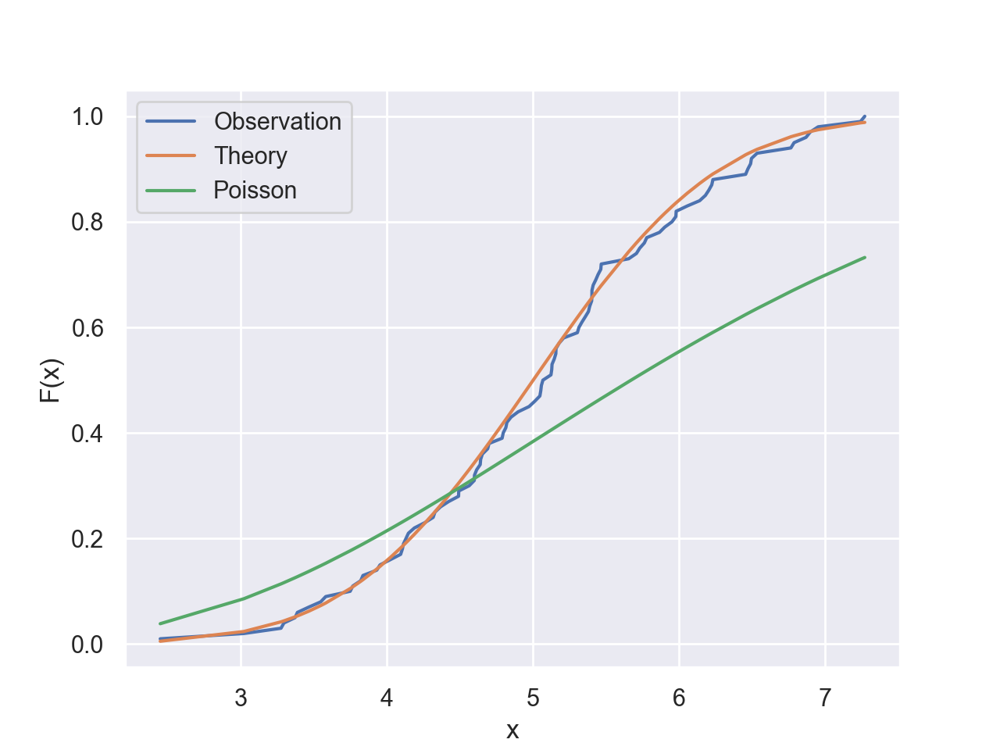

Difference relative to normal distribution
[0.00465987 0.00380705 0.01214829 0.00397889 0.00152979 0.00672521
 0.00776069 0.00707752 0.01219877 0.0051401  0.00155233 0.00112556
 0.00802083 0.00214034 0.00280804 0.0042158  0.01212452 0.00526887
 0.00267199 0.00806754 0.01347403 0.0119329  0.00100632 0.00673188
 0.00064531 0.00293532 0.01134531 0.02474376 0.01514758 0.03066621
 0.03340903 0.02392263 0.01925714 0.01839912 0.00959066 0.00395308
 0.00769031 0.00121064 0.02576477 0.01872424 0.01575824 0.00860579
 0.00984697 0.01889464 0.03875841 0.04418883 0.04824864 0.0407139
 0.03239495 0.02651698 0.0384218  0.03049501 0.02131441 0.01726697
 0.01156862 0.00212102 0.00041316 0.00249287 0.02885382 0.02288539
 0.02068734 0.0192169  0.01734507 0.0105858  0.00547963 0.00384593
 0.01371631 0.02068348 0.02420476 0.02857073 0.03176023 0.04072857
 0.01332122 0.02008412 0.01702687 0.01668273 0.01156524 0.02632584
 0.02615971 0.02896634 0.02562606 0.01614527 0.02416192 0.03273196
 0.03075702 0.025391

In [54]:
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
from numpy.random import seed
mu = 5
sigma = 1
seed(0)
step=2
if(step==1):
    fig, ax = plt.subplots()
    arr_1_more = np.random.normal(mu, sigma, size=6000)
    arr_1_sorted = np.sort(arr_1_more)
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    poisson_pmf = st.poisson.pmf(mu, arr_1_sorted)
    ax.plot(arr_1_sorted, norm_data, label="Normal")
    ax.plot(arr_1_sorted, poisson_pmf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
#generate random aray
if(step>1):
    mysize=100
    arr_1_few = np.random.normal(mu, sigma, size=mysize)
    #sort generated array
    arr_1_sorted = np.sort(arr_1_few)
    #edf
    arr_1_edf_few = np.arange(1, len(arr_1_few)+1) / len(arr_1_few)
    #generate dataset that follow a Poisson distribution with mean=mu
    poisson_cdf = 1-st.poisson.cdf(mu, arr_1_sorted)
    fig, ax = plt.subplots()
    ax.plot(arr_1_sorted, arr_1_edf_few, label="Observation")
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    ax.plot(arr_1_sorted, y_cdf, label="Theory")
    ax.plot(arr_1_sorted, poisson_cdf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
    #calculate absolute difference
    arr_dif_abs = np.abs(y_cdf-arr_1_edf_few)
    print("Difference relative to normal distribution")
    print(arr_dif_abs)
    #get max difference
    dn_ks = max(arr_dif_abs)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    #calculate absolute difference for poisson distribution
    arr_dif_abs_poisson = np.abs(y_cdf-poisson_cdf)
    print("Difference relative to poisson distribution")
    print(arr_dif_abs_poisson)
    ps_ks = max(arr_dif_abs_poisson)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    print("Maximum difference relative to poisson distribution:{}".format(ps_ks))
    D_critial=1.36 * np.sqrt(2/mysize)
    print("Critical value at 95% confidence interval:{}".format(D_critial))

SPOJENE JAMKY PO SLOUCENINACH

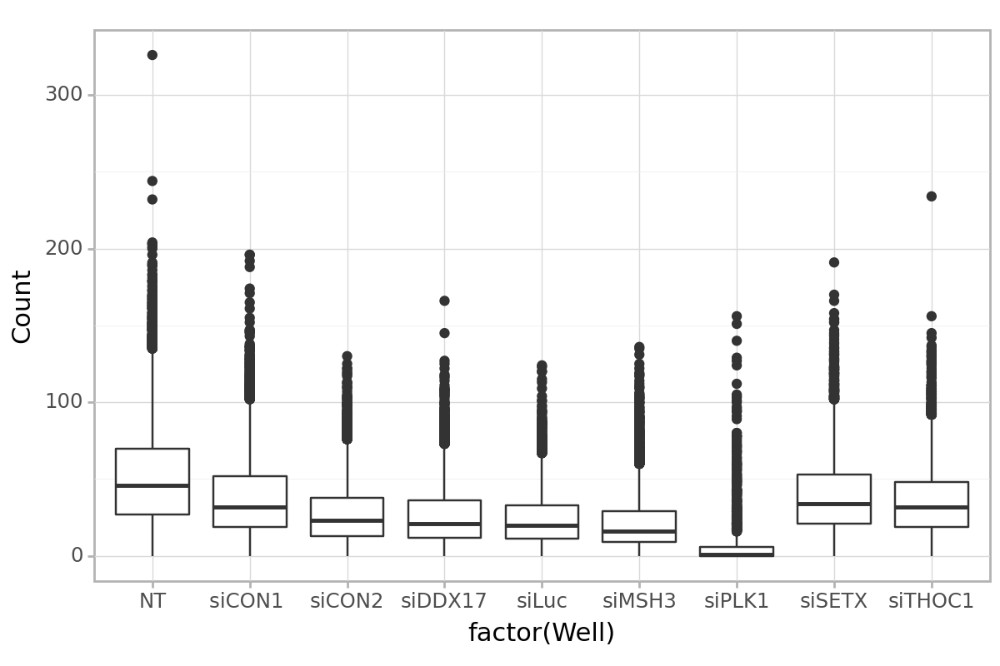

<Figure Size: (600 x 400)>

In [55]:
(
    ggplot(dose_0)
    + aes(x='Compound', y='Count')
    + geom_boxplot()
    + labs(x='factor(Well)', y='Count')
    + theme(figure_size=(6,4))
)

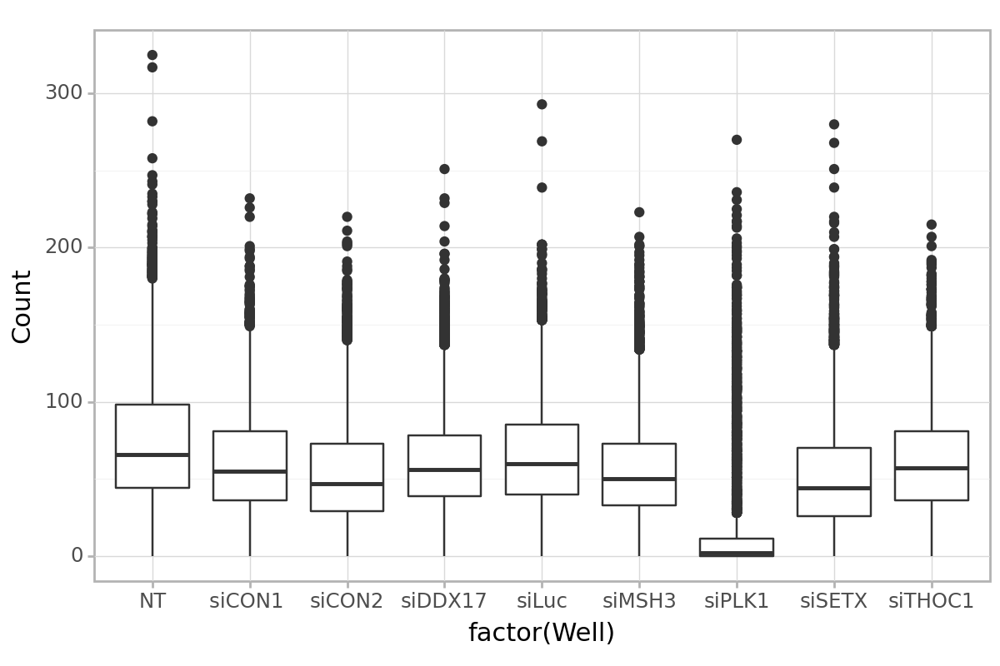

<Figure Size: (600 x 400)>

In [56]:
(
    ggplot(df.query('Dose==100'))
    + aes(x='Compound', y='Count')
    + geom_boxplot()
    + labs(x='factor(Well)', y='Count')
    + theme(figure_size=(6,4))
)